In [0]:
from pyspark.sql import SparkSession


access_key = 'XXXX'
secret_key = 'XXXX'
sc._jsc.hadoopConfiguration().set("fs.s3a.access.key", access_key)
sc._jsc.hadoopConfiguration().set("fs.s3a.secret.key", secret_key)

# If you are using Auto Loader file notification mode to load files, provide the AWS Region ID.
aws_region = "us-east-1"
sc._jsc.hadoopConfiguration().set("fs.s3a.endpoint", "s3." + aws_region + ".amazonaws.com")

S3A - 
S3A (Amazon S3A File System) is a newer and recommended Hadoop-compatible interface for accessing data stored in S3. S3A was introduced as part of Apache Hadoop 2.7. 0. It is built on top of the S3 protocol and uses the S3 object API to provide better performance, scalability

In [0]:
spark = SparkSession.builder \
    .master("yarn") \
    .appName("IPL Dataset") \
    .getOrCreate()

In [0]:
ball_df = spark.read.csv('s3a://ipldataset0/Ball_By_Ball.csv', header='true', inferSchema='true')

In [0]:
from pyspark.sql.types import StructType, StructField, IntegerType, StringType, BooleanType, DateType

# Define schema for match data
ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),
    StructField("legbyes", IntegerType(), True),
    StructField("byes", IntegerType(), True),
    StructField("noballs", IntegerType(), True),
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", BooleanType(), True),
    StructField("bowled", BooleanType(), True),
    StructField("run_out", BooleanType(), True),
    StructField("lbw", BooleanType(), True),
    StructField("retired_hurt", BooleanType(), True),
    StructField("stumped", BooleanType(), True),
    StructField("caught_and_bowled", BooleanType(), True),
    StructField("hit_wicket", BooleanType(), True),
    StructField("obstructingfeild", BooleanType(), True),
    StructField("bowler_wicket", BooleanType(), True),
    StructField("match_date", DateType(), True),
    StructField("season", IntegerType(), True),
    StructField("striker", IntegerType(), True),
    StructField("non_striker", IntegerType(), True),
    StructField("bowler", IntegerType(), True),
    StructField("player_out", IntegerType(), True),
    StructField("fielders", IntegerType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", BooleanType(), True),
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", DateType(), True)
])

In [0]:
ball_schema

Out[21]: StructType([StructField('match_id', IntegerType(), True), StructField('over_id', IntegerType(), True), StructField('ball_id', IntegerType(), True), StructField('innings_no', IntegerType(), True), StructField('team_batting', StringType(), True), StructField('team_bowling', StringType(), True), StructField('striker_batting_position', IntegerType(), True), StructField('extra_type', StringType(), True), StructField('runs_scored', IntegerType(), True), StructField('extra_runs', IntegerType(), True), StructField('wides', IntegerType(), True), StructField('legbyes', IntegerType(), True), StructField('byes', IntegerType(), True), StructField('noballs', IntegerType(), True), StructField('penalty', IntegerType(), True), StructField('bowler_extras', IntegerType(), True), StructField('out_type', StringType(), True), StructField('caught', BooleanType(), True), StructField('bowled', BooleanType(), True), StructField('run_out', BooleanType(), True), StructField('lbw', BooleanType(), True), S

In [0]:
ball_df_schema = spark.read.schema(ball_schema).csv('s3a://ipldataset0/Ball_By_Ball.csv', header='true')

In [0]:
# ball_df_no_schema = spark.read.csv('s3a://ipldataset0/Ball_By_Ball.csv', header='true', inferSchema='true')

In [0]:
# ball_schema_ddl = """
# match_id integer,
# over_id integer,
# ball_id integer
# """

In [0]:
# ball_df_schema_ddl = spark.read.schema(ball_schema_ddl).csv('s3a://ipldataset0/Ball_By_Ball.csv', header='true')

In [0]:
ball_df_schema

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,null,0,null
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,null,0,null
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null


DF = RDD + Schema


In [0]:
ball_df_schema.select("team_batting", "over_id").display()

team_batting,over_id
5,15
5,14
5,14
5,14
5,14
5,14
5,14
5,13
5,13
5,13


In [0]:
ball_df_schema.createOrReplaceTempView("ball_df")

In [0]:
spark.sql("select distinct team_batting from ball_df").display()

team_batting
7
11
3
8
5
6
Gujarat Lions
Kolkata Knight Riders
1
10


In [0]:
spark.sql("select distinct team_batting from ball_df where team_batting rlike '[^0-9]'").display()

team_batting
Gujarat Lions
Kolkata Knight Riders
Delhi Daredevils
Mumbai Indians
Sunrisers Hyderabad
Royal Challengers Bangalore
Rising Pune Supergiants
Kings XI Punjab


In [0]:
clean_ball_df = spark.sql("select distinct team_batting from ball_df where team_batting rlike '[^0-9]'")

In [0]:
clean_ball_df.createOrReplaceTempView("clean_ball")

In [0]:
spark.sql("select * from clean_ball").display()

team_batting
Gujarat Lions
Kolkata Knight Riders
Delhi Daredevils
Mumbai Indians
Sunrisers Hyderabad
Royal Challengers Bangalore
Rising Pune Supergiants
Kings XI Punjab


In [0]:
clean_df = spark.sql("select * from ball_df where team_batting rlike '[^0-9]'")

In [0]:
clean_df.createOrReplaceTempView("clean_table")

### Which team has scored the most boundaries (4s and 6s combined)?


In [0]:
boundaries_df = spark.sql("""select team_batting, 
          count(case when runs_scored = 4 then 1 end) as runs_scored_4s,
          count(case when runs_scored = 6 then 1 end) as runs_scored_6s
          from clean_table
          where runs_scored = 4 or runs_scored = 6
          group by team_batting
          order by runs_scored_4s desc, runs_scored_6s desc
          """).display()

team_batting,runs_scored_4s,runs_scored_6s
Kolkata Knight Riders,228,87
Mumbai Indians,225,118
Sunrisers Hyderabad,220,70
Gujarat Lions,218,92
Delhi Daredevils,202,87
Rising Pune Supergiants,197,89
Kings XI Punjab,189,88
Royal Challengers Bangalore,133,75


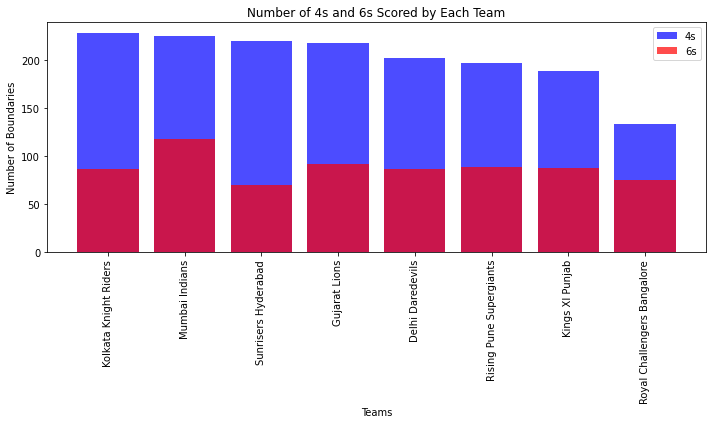

In [0]:
import matplotlib.pyplot as plt
boundaries_pandas_df = boundaries_df.toPandas()

# Plotting
teams = boundaries_pandas_df['team_batting']
fours = boundaries_pandas_df['runs_scored_4s']
sixes = boundaries_pandas_df['runs_scored_6s']

plt.figure(figsize=(10, 6))
plt.bar(teams, fours, label='4s', color='b', alpha=0.7)
plt.bar(teams, sixes, label='6s', color='r', alpha=0.7)

plt.xlabel('Teams')
plt.ylabel('Number of Boundaries')
plt.title('Number of 4s and 6s Scored by Each Team')
plt.xticks(rotation=90)
plt.legend()

plt.tight_layout()
plt.show()

In [0]:
boundaries_df \
.write \
.format("com.databricks.spark.csv") \
.option("header", "true") \
.save("s3a://{}/{}".format("ipldataset0", "output"))